In [3]:
import pandas as pd
import numpy as np
import util
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from matplotlib.lines import Line2D

from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
import umap
import umap.plot
import seaborn as sns


# Constants
activities = {
  'A': 'Push forward',
  'C': 'Hands up and down',
  'P': 'Reading',
  'S': 'Writing'
}


In [5]:
ROOT_DIR = '../Output'
files = {
  'tested_on_Classroom_m1': {
    'trained_on_ClassroomOffice_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAP/fine_grained_trainedon_ClassroomOffice_m1m2m3_242-fixed.h5_gradcam_and_embeddings.npz',
    'trained_on_Classroom_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPSingleEnvironmentMultipleMonitors/fine_grained_trainedon_Classroom_m1m2m3_242.h5_gradcam_and_embeddings.npz',
    'trained_on_Classroom_m1': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAP/fine_grained_trainedon_Classroom_m1_242.h5_gradcam_and_embeddings.npz'
  },

  'tested_on_Classroom_m2': {
    'trained_on_ClassroomOffice_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPClassroomM2/fine_grained_trainedon_ClassroomOffice_m1m2m3_242-fixed.h5_gradcam_and_embeddings.npz',
    'trained_on_Classroom_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPSingleEnvironmentMultipleMonitors/fine_grained_trainedon_Classroom_m1m2m3_242.h5_gradcam_and_embeddings.npz',
    'trained_on_Classroom_m2': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPClassroomM2/fine_grained_trainedon_Classroom_m2_242.h5_gradcam_and_embeddings.npz'
  },
    
  # 'tested_on_Classroom_m3': {
  #   'trained_on_ClassroomOffice_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPClassroomM3/fine_grained_trainedon_ClassroomOffice_m1m2m3_242-fixed.h5_gradcam_and_embeddings.npz',
  #   'trained_on_Classroom_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPSingleEnvironmentMultipleMonitors/fine_grained_trainedon_Classroom_m1m2m3_242.h5_gradcam_and_embeddings.npz',
  #   'trained_on_Classroom_m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPClassroomM3/fine_grained_trainedon_Classroom_m3_242.h5_gradcam_and_embeddings.npz'
  # },

  'tested_on_Office_m1': {
    'trained_on_ClassroomOffice_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPOffice/fine_grained_trainedon_ClassroomOffice_m1m2m3_242-fixed.h5_gradcam_and_embeddings.npz',
    'trained_on_Office_m1m2m3': f'{ROOT_DIR}/trained_on_Office_m1m2m3_242_tested_on_Office_m1/fine_grained_trainedon_Office_m1m2m3_242.h5_gradcam_and_embeddings.npz',
    'trained_on_Office_m1': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPOffice/fine_grained_trainedon_Office_m1_242.h5_gradcam_and_embeddings.npz',
  },

  # 'tested_on_Office_m2': {
  #   'trained_on_ClassroomOffice_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPOfficeM2/fine_grained_trainedon_ClassroomOffice_m1m2m3_242-fixed.h5_gradcam_and_embeddings.npz',
  #   'trained_on_Office_m1m2m3': f'{ROOT_DIR}/trained_on_Office_m1m2m3_242_tested_on_Office_m2/fine_grained_trainedon_Office_m1m2m3_242.h5_gradcam_and_embeddings.npz',
  #   'trained_on_Office_m2': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPOfficeM2/fine_grained_trainedon_Office_m2_242.h5_gradcam_and_embeddings.npz',
  # },

  # 'tested_on_Office_m3': {
  #   'trained_on_ClassroomOffice_m1m2m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPOfficeM3/fine_grained_trainedon_ClassroomOffice_m1m2m3_242-fixed.h5_gradcam_and_embeddings.npz',
  #   'trained_on_Office_m1m2m3': f'{ROOT_DIR}/trained_on_Office_m1m2m3_242_tested_on_Office_m3/fine_grained_trainedon_Office_m1m2m3_242.h5_gradcam_and_embeddings.npz',
  #   'trained_on_Office_m3': f'{ROOT_DIR}/CompareFineGrainedModelsSingleVsMultipleWithSHAPOfficeM3/fine_grained_trainedon_Office_m3_242.h5_gradcam_and_embeddings.npz',
  # },
}

In [6]:
# Create a dictionary to hold the data
data = {}
for test_set, test_dict in files.items():
  data[test_set] = {}
  for trained_on, npz_file_path in test_dict.items():
    saved = np.load(npz_file_path)
    data[test_set][trained_on] = {
      'gradcam': saved['gradcam_heatmaps'],
      # 'embeddings': saved['embeddings'],
      'shap_gradients': saved['shap_gradients_heatmaps'],
      'csv': pd.read_csv(f"{npz_file_path.replace('gradcam_and_embeddings.npz', 'output.csv')}")
    }

In [7]:
# Add a merged csv on each test subset to mark predictions that are correct in all three models
for tested_on in data.keys():
  trained_on_keys = list(data[tested_on].keys())

  csv1 = data[tested_on][trained_on_keys[0]]['csv']
  csv2 = data[tested_on][trained_on_keys[1]]['csv']
  csv3 = data[tested_on][trained_on_keys[2]]['csv']

  suffix1 = f"_{trained_on_keys[0].replace('trained_on_', '')}"
  suffix2 = f"_{trained_on_keys[1].replace('trained_on_', '')}"
  suffix3 = f"_{trained_on_keys[2].replace('trained_on_', '')}"

  csv_merged = pd.merge(left=csv1, right=csv2, how='inner', on='filename', suffixes=(suffix1, suffix2)
).merge(csv3, how='inner', on='filename', suffixes=('', suffix3))

  csv_merged.loc[
    (csv_merged[f'right_prediction{suffix1}']==True) 
    & (csv_merged[f'right_prediction{suffix2}']==True)
    & (csv_merged[f'right_prediction']==True)
    , 'all_right_prediction'] = True
  
  pd.set_option('future.no_silent_downcasting', True)
  csv_merged['all_right_prediction'] = csv_merged['all_right_prediction'].fillna(False).astype(bool)
  data[tested_on]['csv_merged'] = csv_merged


In [21]:
# Add input matrices for each test set

import scipy.io

for tested_on in data.keys():
  csv_merged = data[tested_on]['csv_merged']
  input_mats = None

  for row_index in range(len(csv_merged)):
    row = csv_merged.iloc[row_index]
    testcsv = row['source']
    filename = testcsv.replace('test_set.csv', row['filename'])
    mat_data = scipy.io.loadmat(filename)['csi_mon']
    real_part = np.real(mat_data)**2
    imag_part = np.imag(mat_data)**2
    input_mat = np.expand_dims(np.sqrt(real_part + imag_part), axis=0)

    if row_index == 0:
      input_mats = input_mat
    else:
      input_mats = np.concatenate((input_mats, input_mat), axis=0)  
  data[tested_on]['input'] = input_mats

In [155]:
csv_merged.iloc[0]
# csv_merged.iloc[0]['source'].replace("test_set.csv", "C_batch/batch_1294.mat")

filename                                                              C_batch/batch_1294.mat
label_ClassroomOffice_m1m2m3                                                               C
source_ClassroomOffice_m1m2m3              ../Data/fine_grained/Classroom/80MHz/3mo/m1/Sl...
predicted_label_ClassroomOffice_m1m2m3                                                     C
predicted_prob_ClassroomOffice_m1m2m3                                                    1.0
right_prediction_ClassroomOffice_m1m2m3                                                 True
label_Classroom_m1m2m3                                                                     C
source_Classroom_m1m2m3                    ../Data/fine_grained/Classroom/80MHz/3mo/m1/Sl...
predicted_label_Classroom_m1m2m3                                                           C
predicted_prob_Classroom_m1m2m3                                                          1.0
right_prediction_Classroom_m1m2m3                                     

In [22]:

def plot_testedon(tested_on, data):
  rows = len(activities.keys())
  cols = 4

  # create subplots
  fig, axs = plt.subplots(rows, cols, figsize=(cols*4, rows), dpi=300)

  for row_index in range(rows):
    label = list(activities.keys())[row_index]
    label_description = activities[label]
    print(f'Plotting Grad-CAM for label: {label_description}')

    csv_merged = data[tested_on]['csv_merged']
    subset = csv_merged.loc[(csv_merged['all_right_prediction']==True) & (csv_merged['label']==label)]

    trained_on_keys = list(data[tested_on].keys())

    input_mat = np.mean(data[tested_on]['input'][subset.index], axis=0)
    axs[row_index, 0].imshow(input_mat, cmap='jet')

    gradcam = cv2.resize(np.mean(data[tested_on][trained_on_keys[0]]['gradcam'][subset.index], axis=0), (242,50))
    axs[row_index, 1].imshow(gradcam, cmap='jet')
    gradcam = cv2.resize(np.mean(data[tested_on][trained_on_keys[1]]['gradcam'][subset.index], axis=0), (242,50))
    axs[row_index, 2].imshow(gradcam, cmap='jet')  
    gradcam = cv2.resize(np.mean(data[tested_on][trained_on_keys[2]]['gradcam'][subset.index], axis=0), (242,50))
    axs[row_index, 3].imshow(gradcam, cmap='jet')  

    axs[row_index, 0].set_ylabel(label_description, fontsize=8, rotation=0, labelpad=50)
    axs[row_index, 0].set_xticks([])
    axs[row_index, 0].set_yticks([])
    axs[row_index, 1].set_xticks([])
    axs[row_index, 1].set_yticks([])
    axs[row_index, 2].set_xticks([])
    axs[row_index, 2].set_yticks([])
    axs[row_index, 3].set_xticks([])
    axs[row_index, 3].set_yticks([])  
    

  axs[0, 0].set_title('Input', fontsize=8)
  axs[0, 1].set_title(trained_on_keys[0], fontsize=8)
  axs[0, 2].set_title(trained_on_keys[1], fontsize=8)
  axs[0, 3].set_title(trained_on_keys[2], fontsize=8)

  plt.tight_layout(rect=[0, 0, 1, 0.95])


Plotting for tested_on_Classroom_m1
Plotting Grad-CAM for label: Push forward
Plotting Grad-CAM for label: Hands up and down
Plotting Grad-CAM for label: Reading
Plotting Grad-CAM for label: Writing


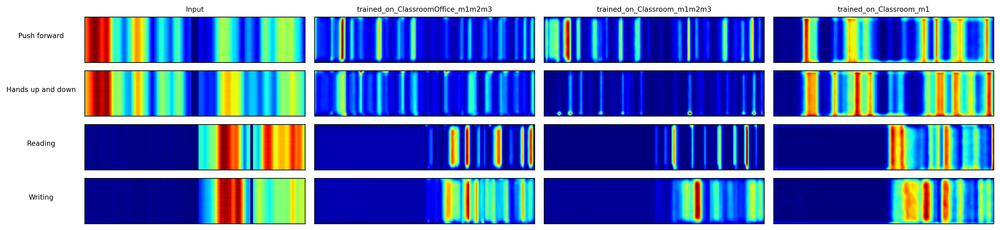

Plotting for tested_on_Classroom_m2
Plotting Grad-CAM for label: Push forward
Plotting Grad-CAM for label: Hands up and down
Plotting Grad-CAM for label: Reading
Plotting Grad-CAM for label: Writing


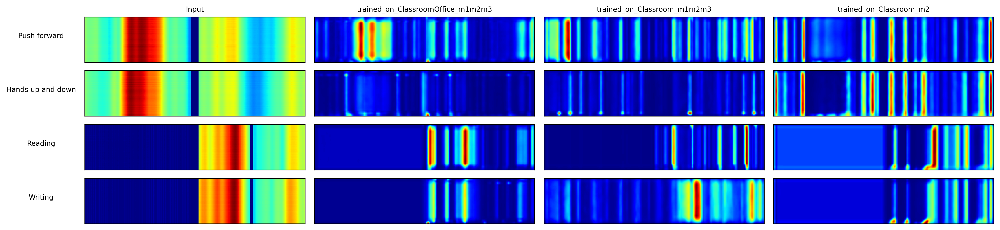

Plotting for tested_on_Classroom_m3
Plotting Grad-CAM for label: Push forward
Plotting Grad-CAM for label: Hands up and down
Plotting Grad-CAM for label: Reading
Plotting Grad-CAM for label: Writing


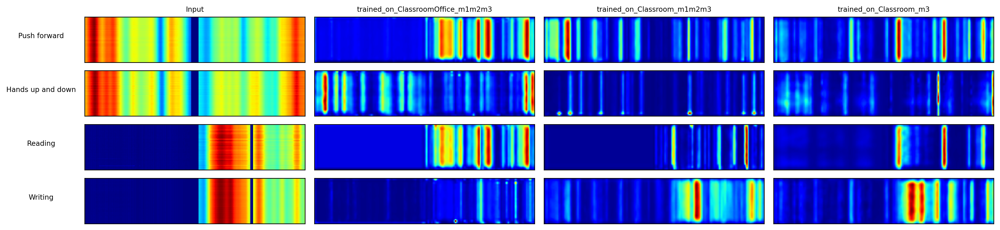

Plotting for tested_on_Office_m1
Plotting Grad-CAM for label: Push forward
Plotting Grad-CAM for label: Hands up and down
Plotting Grad-CAM for label: Reading
Plotting Grad-CAM for label: Writing


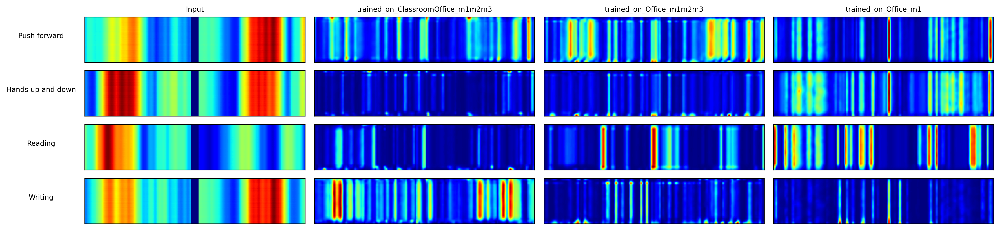

Plotting for tested_on_Office_m2
Plotting Grad-CAM for label: Push forward
Plotting Grad-CAM for label: Hands up and down
Plotting Grad-CAM for label: Reading
Plotting Grad-CAM for label: Writing


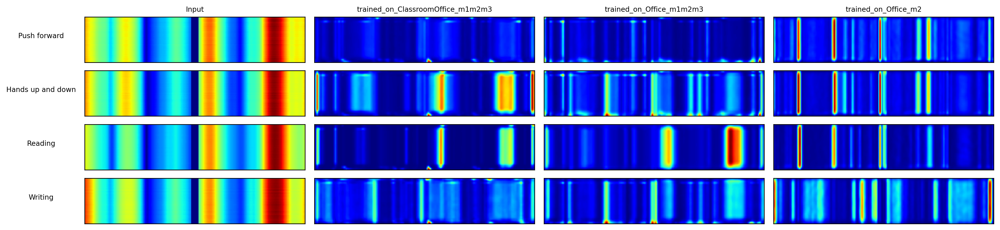

Plotting for tested_on_Office_m3
Plotting Grad-CAM for label: Push forward
Plotting Grad-CAM for label: Hands up and down
Plotting Grad-CAM for label: Reading
Plotting Grad-CAM for label: Writing


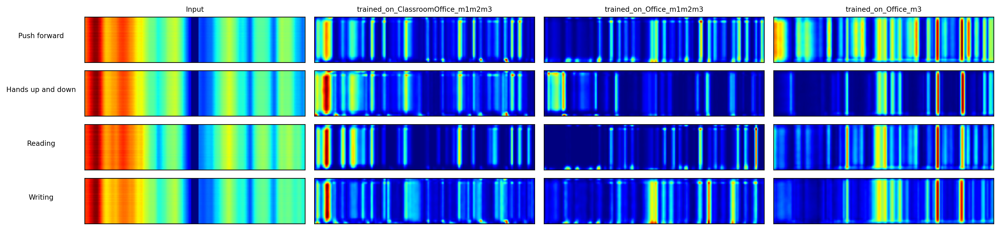

In [23]:
for tested_on in data.keys():
  print(f'Plotting for {tested_on}')
  plot_testedon(tested_on, data)
  # plt.savefig(f'{tested_on}_gradcam.png', dpi=300, bbox_inches='tight')
  plt.show()

----
# Plot para o artigo


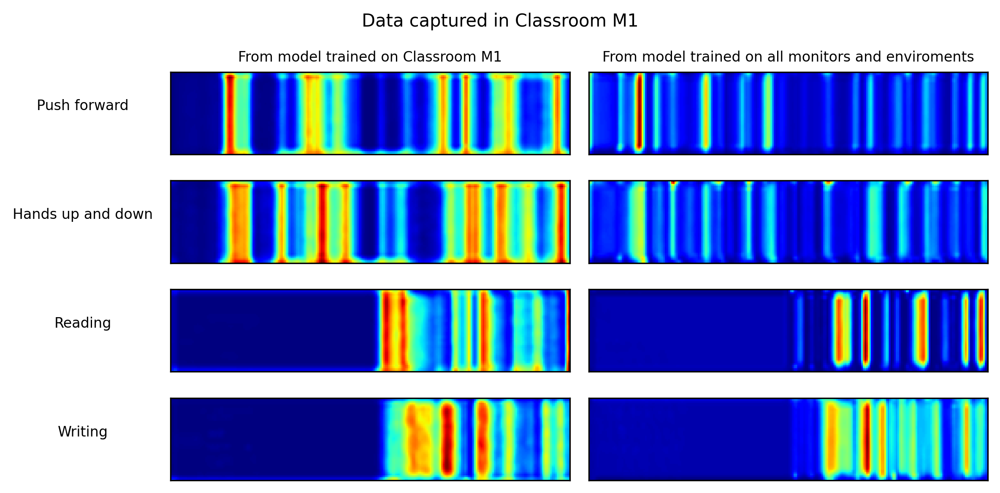

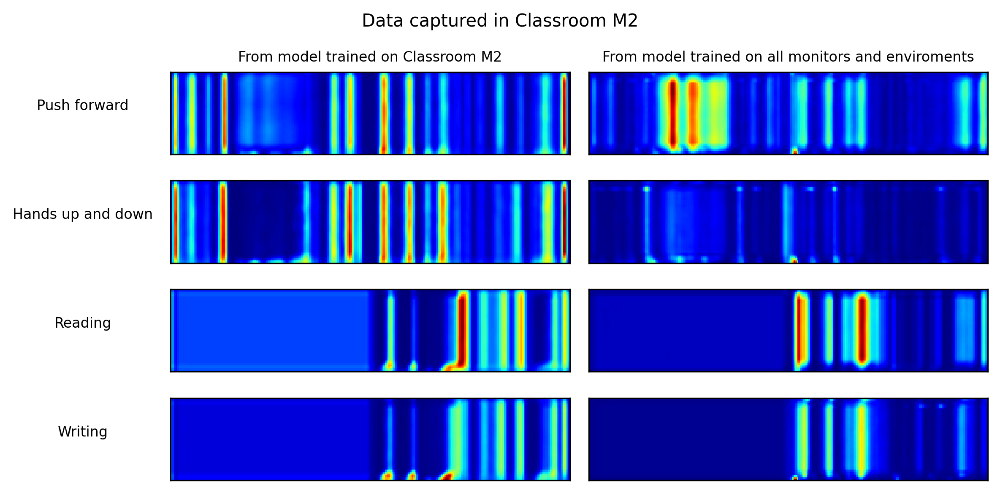

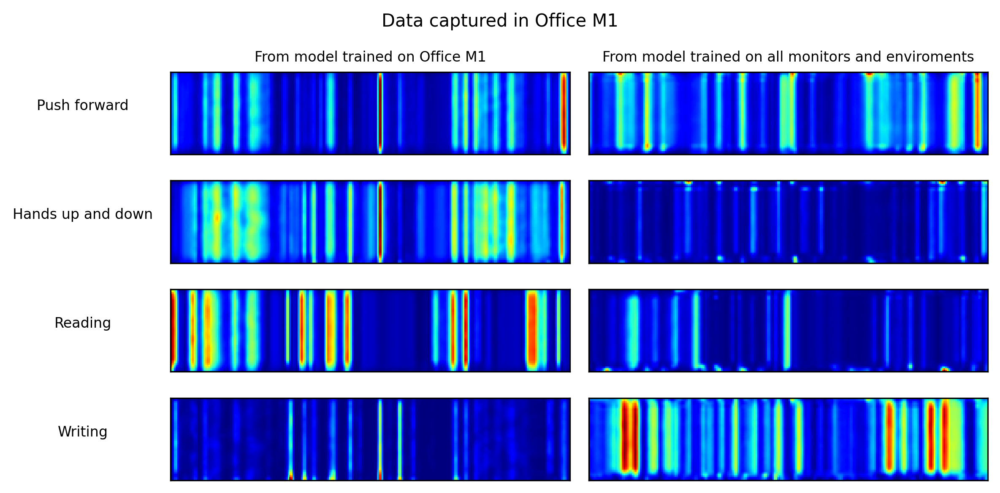

In [5]:

def plot_testedon_simplified(tested_on, data):
  rows = len(activities.keys())
  cols = 2

  # create subplots
  fig, axs = plt.subplots(rows, cols, figsize=(cols*4, rows), dpi=300)

  for row_index in range(rows):
    label = list(activities.keys())[row_index]
    label_description = activities[label]

    csv_merged = data[tested_on]['csv_merged']
    subset = csv_merged.loc[(csv_merged['all_right_prediction']==True) & (csv_merged['label']==label)]

    trained_on_keys = list(data[tested_on].keys())

    gradcam = cv2.resize(np.mean(data[tested_on][trained_on_keys[2]]['gradcam'][subset.index], axis=0), (242,50))
    axs[row_index, 0].imshow(gradcam, cmap='jet')
    gradcam = cv2.resize(np.mean(data[tested_on][trained_on_keys[0]]['gradcam'][subset.index], axis=0), (242,50))
    axs[row_index, 1].imshow(gradcam, cmap='jet')  


    axs[row_index, 0].set_ylabel(label_description, fontsize=8, rotation=0, labelpad=50)
    axs[row_index, 0].set_xticks([])
    axs[row_index, 0].set_yticks([])
    axs[row_index, 1].set_xticks([])
    axs[row_index, 1].set_yticks([])

  title0 = trained_on_keys[2].replace('trained_on_', 'From model trained on ').replace('_m1', ' M1').replace('_m2', ' M2').replace('_m3', ' M3')
  title1 = trained_on_keys[0].replace('trained_on_', 'From model trained on ').replace('ClassroomOffice_m1m2m3', 'all monitors and enviroments')
  suptitle = tested_on.replace('tested_on_', 'Data captured in ').replace('_m1', ' M1').replace('_m2', ' M2').replace('_m3', ' M3')

  axs[0, 0].set_title(title0, fontsize=8)
  axs[0, 1].set_title(title1, fontsize=8)


  plt.tight_layout(rect=[0, 0, 1, 0.95])
  plt.suptitle(suptitle, fontsize=10)

plot_testedon_simplified('tested_on_Classroom_m1', data)
plt.savefig(f'SAIDAS/19-gradcam1.png', dpi=300, bbox_inches='tight')
plot_testedon_simplified('tested_on_Classroom_m2', data)
plt.savefig(f'SAIDAS/19-gradcam2.png', dpi=300, bbox_inches='tight')
plot_testedon_simplified('tested_on_Office_m1', data)
plt.savefig(f'SAIDAS/19-gradcam3.png', dpi=300, bbox_inches='tight')
plt.show()

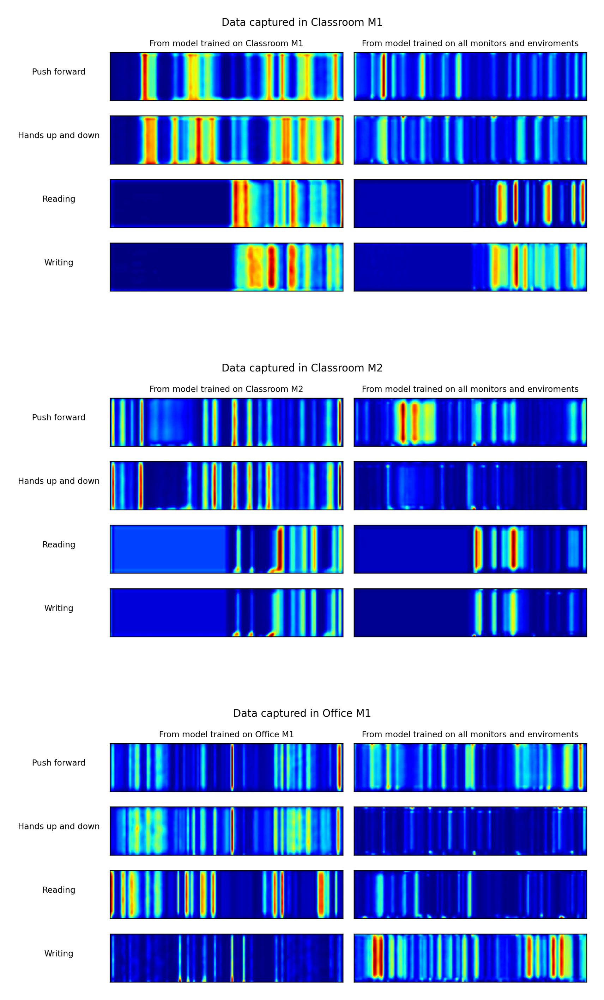

In [7]:
# a subplot with 3 rows, eacho row will imshow a png
fig, axs = plt.subplots(3, 1, figsize=(8, 12), dpi=300)
axs[0].imshow(plt.imread('SAIDAS/19-gradcam1.png'))
axs[1].imshow(plt.imread('SAIDAS/19-gradcam2.png'))
axs[2].imshow(plt.imread('SAIDAS/19-gradcam3.png'))
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')  
plt.savefig(f'SAIDAS/19-gradcam_all.png', dpi=300, bbox_inches='tight')
plt.show()


----
# t-SNE gradcam

In [113]:
# First, create an aggreated explanation dataframe
dataframe_proto = {
  'explanation': [],
  'label': [],
  'activity_group': [],
  'tested_on': [],
  'tested_on_monitor': [],
  'tested_on_environment': [],
  'trained_on': [],
  'trained_on_monitor': [],
  'trained_on_environment': [],
  'activity_group_tested_on_environment': []
}
for tested_on in data.keys():
  csv_merged = data[tested_on]['csv_merged']
  trained_on_keys = list(data[tested_on].keys())
  tested_on_environment = tested_on.split('_')[2] 
  tested_on_monitor = tested_on.split('_')[3]

  for activity in activities.keys():
    label = activities[activity]
    activity_group = "ample" if activity in ['A', 'C'] else "restricted"
    subset = csv_merged.loc[(csv_merged['all_right_prediction']==True) & (csv_merged['label']==activity)]
    activity_group_tested_on_environment = f"{activity_group}_{tested_on_environment}"

    for trained_on in trained_on_keys:
      if trained_on == 'csv_merged':
        continue
      trained_on_cleaned = trained_on.replace('trained_on_', '')
      trained_on_environment = trained_on_cleaned.split('_')[0]
      trained_on_monitor = trained_on_cleaned.split('_')[1]

      # print(f'Processing {label} for {tested_on} trained on {trained_on}')
      explanation = np.mean(data[tested_on][trained_on]['gradcam'][subset.index], axis=0).flatten()
      
      dataframe_proto['explanation'].append(explanation)
      dataframe_proto['label'].append(label)
      dataframe_proto['activity_group'].append(activity_group)
      dataframe_proto['tested_on'].append(tested_on)
      dataframe_proto['tested_on_monitor'].append(tested_on_monitor)
      dataframe_proto['tested_on_environment'].append(tested_on_environment)
      dataframe_proto['trained_on'].append(trained_on)
      dataframe_proto['trained_on_monitor'].append(trained_on_monitor)
      dataframe_proto['trained_on_environment'].append(trained_on_environment)
      dataframe_proto['activity_group_tested_on_environment'].append(activity_group_tested_on_environment)


print(f'Created {c} aggregated dataframes')

aggregated_explanations = pd.DataFrame(dataframe_proto)
aggregated_explanations.to_csv('SAIDAS/19-aggregated_explanations.csv', index=False)
aggregated_explanations.head()

Created 24 aggregated dataframes


,explanation,label,activity_group,tested_on,tested_on_monitor,tested_on_environment,trained_on,trained_on_monitor,trained_on_environment,activity_group_tested_on_environment
0,"[0.04435976, 0.016591514, 0.013841672, 0.00874...",Push forward,ample,tested_on_Classroom_m1,m1,Classroom,trained_on_ClassroomOffice_m1m2m3,m1m2m3,ClassroomOffice,ample_Classroom
1,"[0.0027944935, 0.0056820894, 0.00276032, 0.004...",Push forward,ample,tested_on_Classroom_m1,m1,Classroom,trained_on_Classroom_m1m2m3,m1m2m3,Classroom,ample_Classroom
2,"[0.00064419326, 0.00058279844, 0.0006844385, 0...",Push forward,ample,tested_on_Classroom_m1,m1,Classroom,trained_on_Classroom_m1,m1,Classroom,ample_Classroom
3,"[0.022818618, 0.010211596, 0.011735645, 0.0112...",Hands up and down,ample,tested_on_Classroom_m1,m1,Classroom,trained_on_ClassroomOffice_m1m2m3,m1m2m3,ClassroomOffice,ample_Classroom
4,"[0.0006757968, 0.0002512816, 0.00046929627, 0....",Hands up and down,ample,tested_on_Classroom_m1,m1,Classroom,trained_on_Classroom_m1m2m3,m1m2m3,Classroom,ample_Classroom


/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


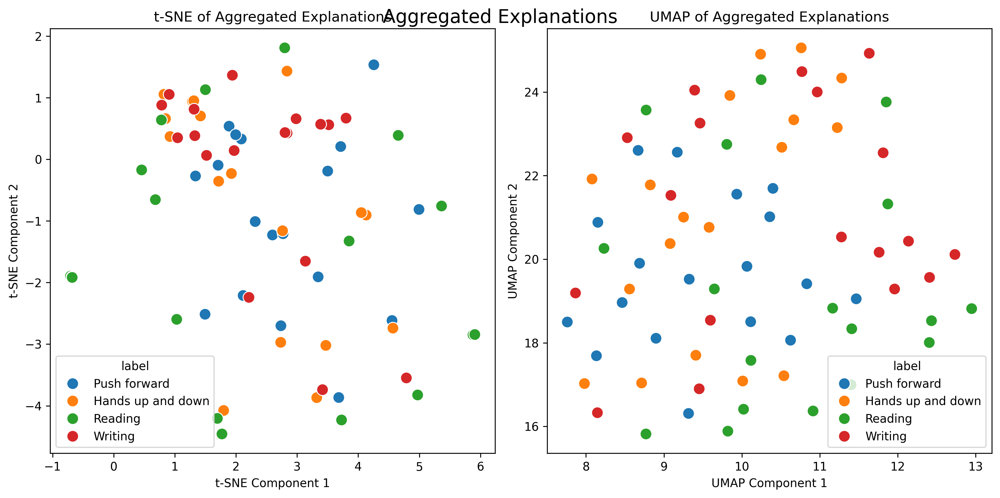

In [85]:
# Now, we can plot the t-SNE and UMAP for the aggregated explanations
def plot_tsne_umap(dataframe, title, perplexity=30, label_column='label', n_neighbors=10, min_dist=0.7): 
  explanations_ndarray = np.array(dataframe['explanation'].tolist())

  # Create a new figure
  fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

  # t-SNE
  tsne = TSNE(n_components=2, perplexity=perplexity,random_state=42)
  tsne_results = tsne.fit_transform(explanations_ndarray)
  
  sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=dataframe[label_column], ax=axs[0], s=100)
  axs[0].set_title(f't-SNE of {title}')
  axs[0].set_xlabel('t-SNE Component 1')
  axs[0].set_ylabel('t-SNE Component 2')
  # make the points larger


  # UMAP
  reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
  umap_results = reducer.fit_transform(explanations_ndarray)
  
  sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], hue=dataframe[label_column], ax=axs[1], s=100)
  axs[1].set_title(f'UMAP of {title}')
  axs[1].set_xlabel('UMAP Component 1')
  axs[1].set_ylabel('UMAP Component 2')

  plt.tight_layout()
  plt.suptitle(title, fontsize=16)
  plt.show()

# Plot t-SNE and UMAP for the aggregated explanations
plot_tsne_umap(aggregated_explanations, 'Aggregated Explanations')

Plotting t-SNE and UMAP for label


/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


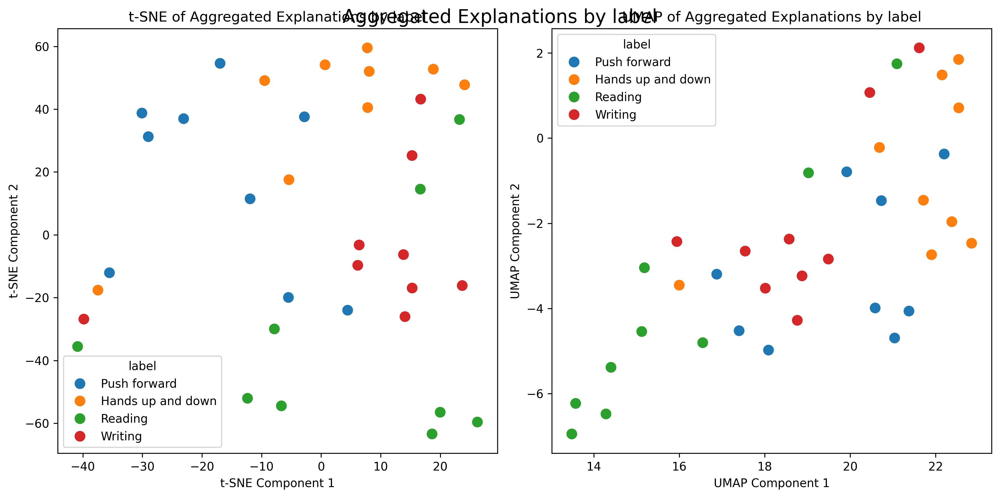

Plotting t-SNE and UMAP for activity_group


/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


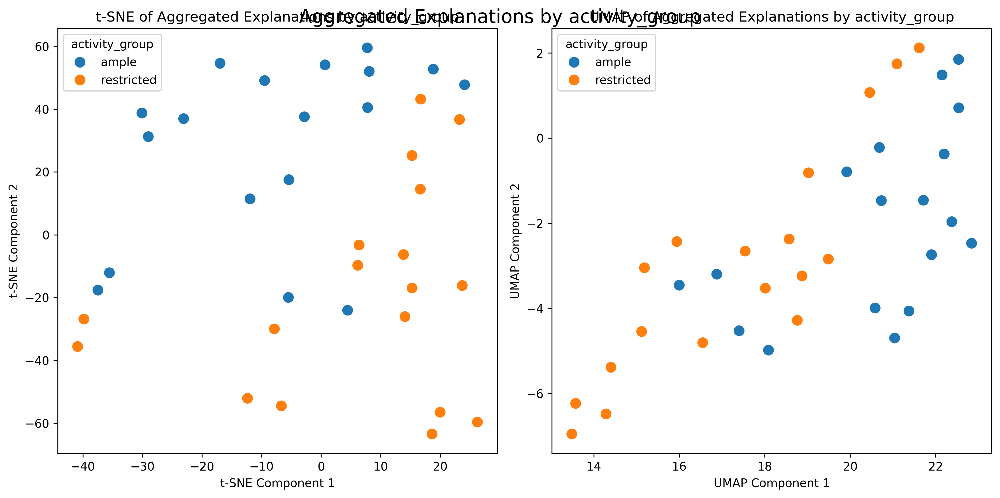

Plotting t-SNE and UMAP for tested_on_environment


/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


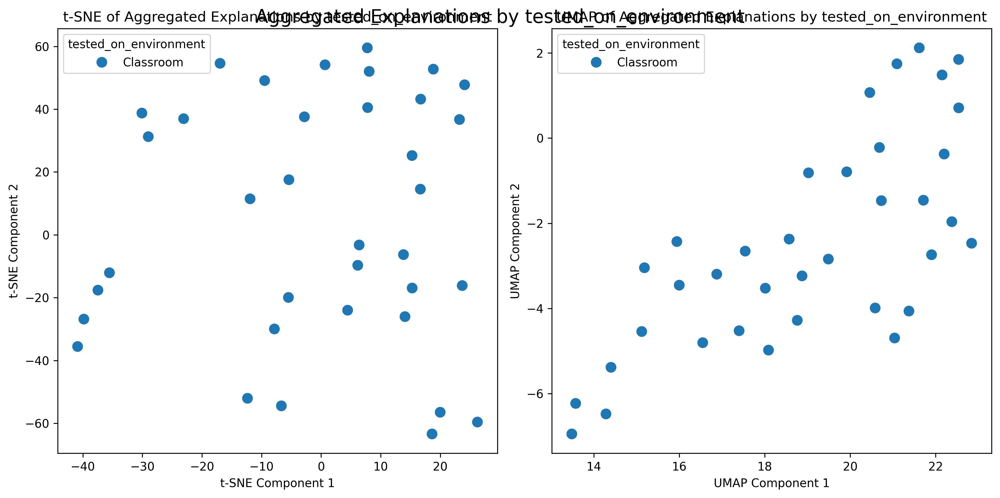

Plotting t-SNE and UMAP for activity_group_tested_on_environment


/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


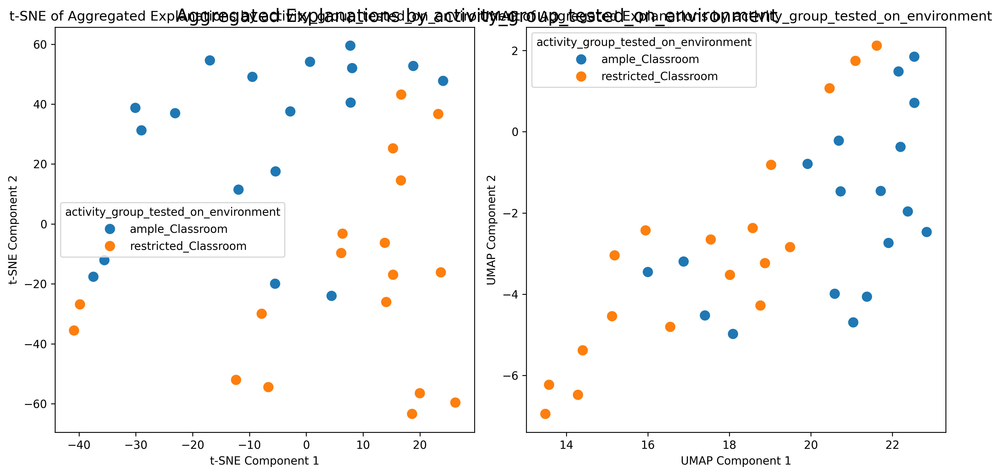

In [131]:
label_columns = ['label', 'activity_group', 'tested_on_environment', 'activity_group_tested_on_environment']
# sub = aggregated_explanations.loc[aggregated_explanations['trained_on']=='trained_on_ClassroomOffice_m1m2m3']
# sub = aggregated_explanations
# sub = aggregated_explanations.loc[(aggregated_explanations['trained_on']=='trained_on_ClassroomOffice_m1m2m3') & (aggregated_explanations['activity_group']=='restricted')]
# sub = aggregated_explanations.loc[ (aggregated_explanations['activity_group']=='restricted')]
sub = aggregated_explanations.loc[ (aggregated_explanations['tested_on_environment']=='Classroom')]
for label_column in label_columns:
  print(f'Plotting t-SNE and UMAP for {label_column}')
  plot_tsne_umap(sub, f'Aggregated Explanations by {label_column}', label_column=label_column, perplexity=7, n_neighbors=4, min_dist=.7)

In [35]:
aggregated_explanations['explanation']
# create a ndarray from the explanations
explanations_ndarray = np.array(aggregated_explanations['explanation'].tolist())
print(f'Created ndarray with shape {explanations_ndarray.shape}')

Created ndarray with shape (72, 3025)


In [39]:
explanations_ndarray[0]

array([0.04435976, 0.01659151, 0.01384167, ..., 0.0055905 , 0.00785634,
       0.00443919], dtype=float32)

----
# t-SNE grad-cam part 2


In [161]:
# ample vs restricted in the same environment
csv_merged1 = data['tested_on_Classroom_m1']['csv_merged']
csv_merged2 = data['tested_on_Classroom_m2']['csv_merged']
csv_merged3 = data['tested_on_Classroom_m3']['csv_merged']

gradcam1 = data['tested_on_Classroom_m1']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam2 = data['tested_on_Classroom_m2']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam3 = data['tested_on_Classroom_m3']['trained_on_ClassroomOffice_m1m2m3']['gradcam']

csv_merged1['activity_group'] = csv_merged1['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged2['activity_group'] = csv_merged2['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged3['activity_group'] = csv_merged3['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
# subset1 = csv_merged1.loc[(csv_merged1['all_right_prediction']==True) & (csv_merged1['label'].isin(['A', 'C']))]

csv_merged1 = csv_merged1.loc[(csv_merged1['all_right_prediction']==True)]
csv_merged2 = csv_merged2.loc[(csv_merged2['all_right_prediction']==True)]
csv_merged3 = csv_merged3.loc[(csv_merged3['all_right_prediction']==True)]

gradcam1 = gradcam1[csv_merged1.index].reshape(len(csv_merged1), -1)
gradcam2 = gradcam2[csv_merged2.index].reshape(len(csv_merged2), -1)
gradcam3 = gradcam3[csv_merged3.index].reshape(len(csv_merged3), -1)

X = np.concatenate((gradcam1, gradcam2, gradcam3), axis=0)                                          
y = np.concatenate((csv_merged1['activity_group'].values, csv_merged2['activity_group'].values, csv_merged3['activity_group'].values), axis=0)

# X = gradcam1
# y = csv_merged1['activity_group'].values

In [8]:
def plot_tsne_umap(X, y, title, perplexity=30, n_neighbors=10, min_dist=0.7, s=3): 

  # Create a new figure
  fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

  # t-SNE
  tsne = TSNE(n_components=2, perplexity=perplexity,random_state=42)
  tsne_results = tsne.fit_transform(X)
  
  sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=y, ax=axs[0], s=s)
  axs[0].set_title(f't-SNE of {title}')
  axs[0].set_xlabel('t-SNE Component 1')
  axs[0].set_ylabel('t-SNE Component 2')
  # make the points larger


  # UMAP
  # reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
  reducer = umap.UMAP(n_neighbors=n_neighbors, random_state=42)
  umap_results = reducer.fit_transform(X)
  
  sns.scatterplot(x=umap_results[:,0], y=umap_results[:,1], hue=y, ax=axs[1], s=s)
  axs[1].set_title(f'UMAP of {title}')
  axs[1].set_xlabel('UMAP Component 1')
  axs[1].set_ylabel('UMAP Component 2')

  plt.tight_layout()
  plt.suptitle(title, fontsize=16)
  plt.show()

# Plot t-SNE and UMAP for the aggregated explanations


/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


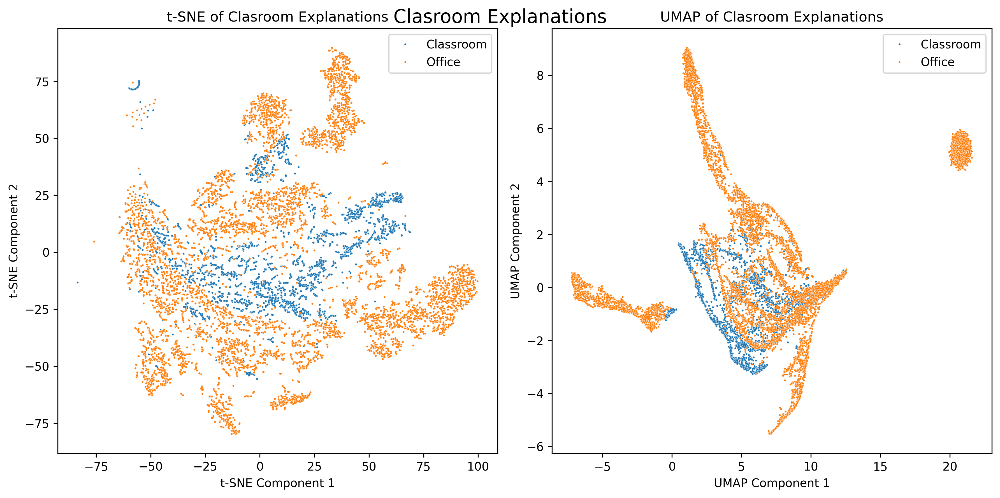

In [182]:
plot_tsne_umap(X,y, 'Clasroom Explanations',perplexity=30, n_neighbors=30)

/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/diogo/miniconda3/envs/tensorflow/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


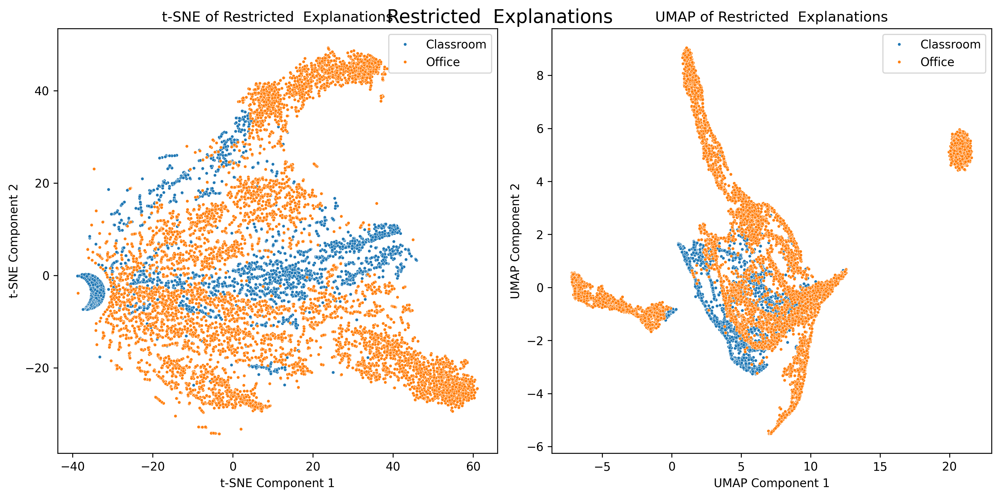

In [183]:
# ample vs restricted in the same environment
csv_merged1 = data['tested_on_Classroom_m1']['csv_merged']
csv_merged2 = data['tested_on_Classroom_m2']['csv_merged']
csv_merged3 = data['tested_on_Classroom_m3']['csv_merged']
csv_merged4 = data['tested_on_Office_m1']['csv_merged']
csv_merged5 = data['tested_on_Office_m2']['csv_merged']
csv_merged6 = data['tested_on_Office_m3']['csv_merged'] 

gradcam1 = data['tested_on_Classroom_m1']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam2 = data['tested_on_Classroom_m2']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam3 = data['tested_on_Classroom_m3']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam4 = data['tested_on_Office_m1']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam5 = data['tested_on_Office_m2']['trained_on_ClassroomOffice_m1m2m3']['gradcam']
gradcam6 = data['tested_on_Office_m3']['trained_on_ClassroomOffice_m1m2m3']['gradcam']

csv_merged1['activity_group'] = csv_merged1['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged2['activity_group'] = csv_merged2['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged3['activity_group'] = csv_merged3['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged4['activity_group'] = csv_merged4['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged5['activity_group'] = csv_merged5['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')
csv_merged6['activity_group'] = csv_merged6['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')

csv_merged1['tested_on_environment'] = 'Classroom'
csv_merged2['tested_on_environment'] = 'Classroom'
csv_merged3['tested_on_environment'] = 'Classroom'
csv_merged4['tested_on_environment'] = 'Office'
csv_merged5['tested_on_environment'] = 'Office'
csv_merged6['tested_on_environment'] = 'Office'

csv_merged1 = csv_merged1.loc[(csv_merged1['all_right_prediction']==True)& (csv_merged1['activity_group'].isin(['restricted']))]
csv_merged2 = csv_merged2.loc[(csv_merged2['all_right_prediction']==True)& (csv_merged2['activity_group'].isin(['restricted']))]
csv_merged3 = csv_merged3.loc[(csv_merged3['all_right_prediction']==True)& (csv_merged3['activity_group'].isin(['restricted']))]
csv_merged4 = csv_merged4.loc[(csv_merged4['all_right_prediction']==True)& (csv_merged4['activity_group'].isin(['restricted']))]
csv_merged5 = csv_merged5.loc[(csv_merged5['all_right_prediction']==True)& (csv_merged5['activity_group'].isin(['restricted']))]
csv_merged6 = csv_merged6.loc[(csv_merged6['all_right_prediction']==True)& (csv_merged6['activity_group'].isin(['restricted']))]

gradcam1 = gradcam1[csv_merged1.index].reshape(len(csv_merged1), -1)
gradcam2 = gradcam2[csv_merged2.index].reshape(len(csv_merged2), -1)
gradcam3 = gradcam3[csv_merged3.index].reshape(len(csv_merged3), -1)
gradcam4 = gradcam4[csv_merged4.index].reshape(len(csv_merged4), -1)
gradcam5 = gradcam5[csv_merged5.index].reshape(len(csv_merged5), -1)
gradcam6 = gradcam6[csv_merged6.index].reshape(len(csv_merged6), -1)

X = np.concatenate((gradcam1, gradcam2, gradcam3, gradcam4, gradcam5, gradcam6), axis=0)                                          
y = np.concatenate((csv_merged1['tested_on_environment'].values, 
                    csv_merged2['tested_on_environment'].values, 
                    csv_merged3['tested_on_environment'].values, 
                    csv_merged4['tested_on_environment'].values,
                    csv_merged5['tested_on_environment'].values,
                    csv_merged6['tested_on_environment'].values,
                    ), axis=0)

# X = gradcam1
# y = csv_merged1['activity_group'].values
plot_tsne_umap(X,y, 'Restricted  Explanations',perplexity=150, n_neighbors=30, s=7)

----
# t-SNE part 3

In [18]:
# ample vs restricted in the same environment
csv_merged1 = data['tested_on_Office_m1']['csv_merged']

gradcam1 = data['tested_on_Office_m1']['trained_on_ClassroomOffice_m1m2m3']['gradcam']

shap1 = data['tested_on_Office_m1']['trained_on_ClassroomOffice_m1m2m3']['shap_gradients']

csv_merged1['activity_group'] = csv_merged1['label'].apply(lambda x: 'ample' if x in ['A', 'C'] else 'restricted')

csv_merged1['tested_on_environment'] = 'Office'


csv_merged1 = csv_merged1.loc[(csv_merged1['all_right_prediction']==True)]

gradcam1 = gradcam1[csv_merged1.index].reshape(len(csv_merged1), -1)
shap1 = shap1[csv_merged1.index].reshape(len(csv_merged1), -1)


y = csv_merged1['label'].values


In [35]:
def plot_tsne_2(X1, X2, y, title1, title2, perplexity1=30, perplexity2=30, s=5): 

  # Create a new figure
  fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

  # Labels in correct order
  label_encoder = LabelEncoder()
  numeric_labels = label_encoder.fit_transform(y)
  class_names = label_encoder.classes_
  class_names = np.array([activities[classname] for classname in class_names ])
  colormap = 'tab10'
  cmap = plt.get_cmap(colormap, len(class_names))

  # t-SNE
  tsne = TSNE(n_components=2, perplexity=perplexity1,random_state=42)
  tsne_results = tsne.fit_transform(X1)
  
  sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], c=numeric_labels, cmap=cmap, ax=axs[0], s=s)
  axs[0].set_title(f't-SNE of {title1}')
  axs[0].set_xlabel('t-SNE Component 1')
  axs[0].set_ylabel('t-SNE Component 2')
  axs[0].grid(True)

  # t-SNE 2
  tsne = TSNE(n_components=2, perplexity=perplexity2,random_state=42)
  tsne_results = tsne.fit_transform(X2)
  
  sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], c=numeric_labels, cmap=cmap, ax=axs[1], s=s)
  axs[1].set_title(f'{title2}')
  axs[1].set_xlabel('t-SNE Component 1')
  axs[1].set_ylabel('t-SNE Component 2')
  axs[1].grid(True)

  legend_handles = []
  for i, class_name in enumerate(class_names):
      # Use the same cmap to get the color for each class
      color = cmap(i)
      legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', label=class_name,
                                      markersize=10, markerfacecolor=color))

  plt.legend(handles=legend_handles, loc='upper right', bbox_to_anchor=(1.15, 1), fontsize=8)



  plt.tight_layout()
  plt.savefig(f'SAIDAS/19-tsne-gradcam-shap.png', dpi=300, bbox_inches='tight')

  plt.show()

# Plot t-SNE and UMAP for the aggregated explanations


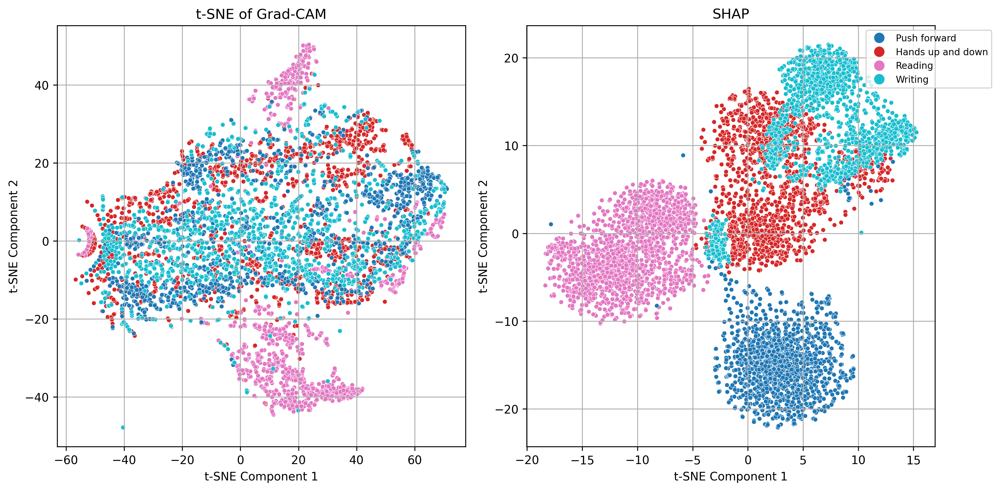

In [36]:
plot_tsne_2(gradcam1, shap1, y, 'Grad-CAM', 'SHAP', perplexity1=50, perplexity2=50, s=15)
plt.show()


----
# SHAP


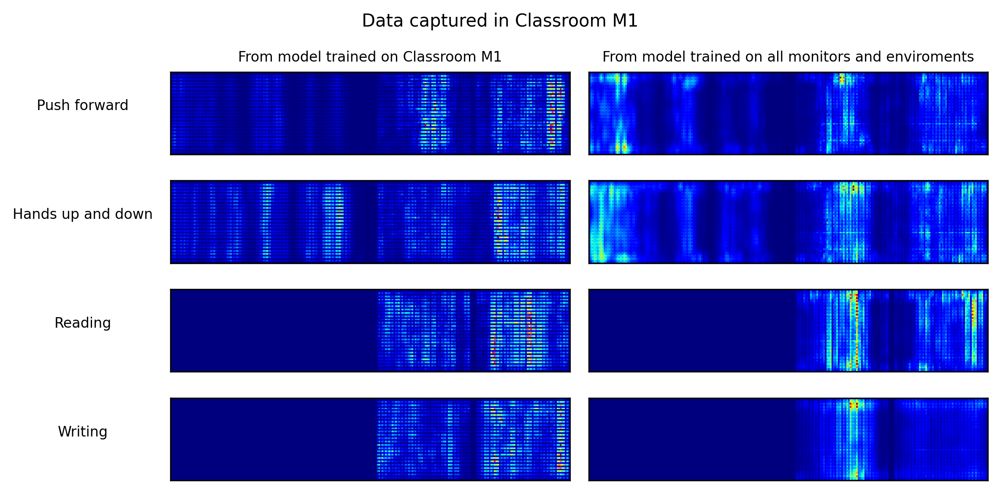

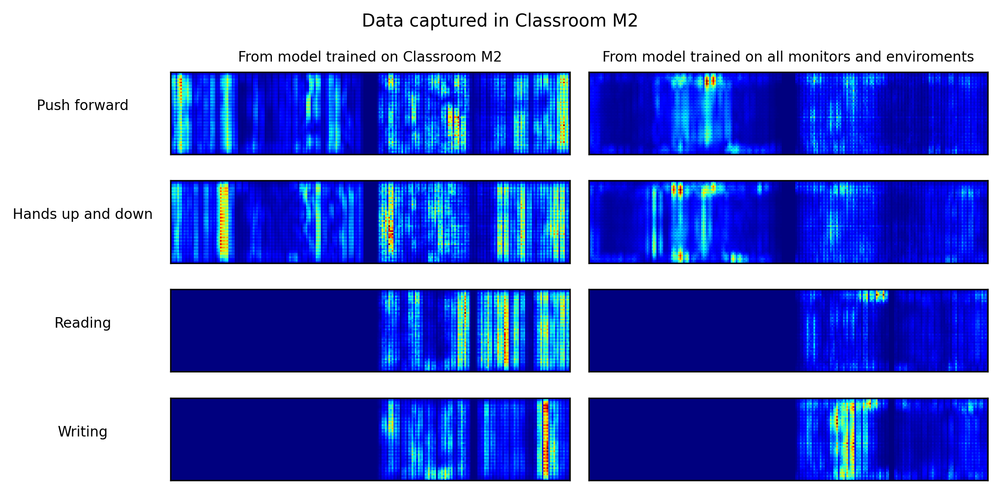

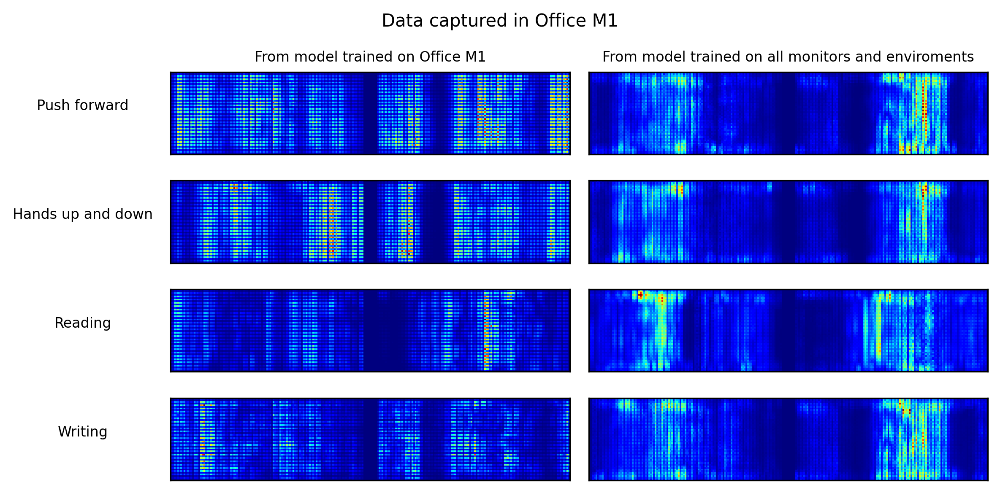

In [14]:

def plot_shap_testedon_simplified(tested_on, data):
  rows = len(activities.keys())
  cols = 2

  # create subplots
  fig, axs = plt.subplots(rows, cols, figsize=(cols*4, rows), dpi=300)

  for row_index in range(rows):
    label = list(activities.keys())[row_index]
    label_description = activities[label]

    csv_merged = data[tested_on]['csv_merged']
    subset = csv_merged.loc[(csv_merged['all_right_prediction']==True) & (csv_merged['label']==label)]

    trained_on_keys = list(data[tested_on].keys())

    shap = np.mean(np.abs(data[tested_on][trained_on_keys[2]]['shap_gradients'][subset.index]).sum(axis=-1), axis=0)
    axs[row_index, 0].imshow(shap, cmap='jet')
    shap = np.mean(np.abs(data[tested_on][trained_on_keys[0]]['shap_gradients'][subset.index]).sum(axis=-1), axis=0)    
    # shap = cv2.resize(np.mean(data[tested_on][trained_on_keys[0]]['shap_gradients'][subset.index], axis=0), (242,50))
    axs[row_index, 1].imshow(shap, cmap='jet')  


    axs[row_index, 0].set_ylabel(label_description, fontsize=8, rotation=0, labelpad=50)
    axs[row_index, 0].set_xticks([])
    axs[row_index, 0].set_yticks([])
    axs[row_index, 1].set_xticks([])
    axs[row_index, 1].set_yticks([])

  title0 = trained_on_keys[2].replace('trained_on_', 'From model trained on ').replace('_m1', ' M1').replace('_m2', ' M2').replace('_m3', ' M3')
  title1 = trained_on_keys[0].replace('trained_on_', 'From model trained on ').replace('ClassroomOffice_m1m2m3', 'all monitors and enviroments')
  suptitle = tested_on.replace('tested_on_', 'Data captured in ').replace('_m1', ' M1').replace('_m2', ' M2').replace('_m3', ' M3')

  axs[0, 0].set_title(title0, fontsize=8)
  axs[0, 1].set_title(title1, fontsize=8)


  plt.tight_layout(rect=[0, 0, 1, 0.95])
  plt.suptitle(suptitle, fontsize=10)

plot_shap_testedon_simplified('tested_on_Classroom_m1', data)
plt.savefig(f'SAIDAS/19-shap1.png', dpi=300, bbox_inches='tight')
plot_shap_testedon_simplified('tested_on_Classroom_m2', data)
plt.savefig(f'SAIDAS/19-shap2.png', dpi=300, bbox_inches='tight')
plot_shap_testedon_simplified('tested_on_Office_m1', data)
plt.savefig(f'SAIDAS/19-shap3.png', dpi=300, bbox_inches='tight')
plt.show()

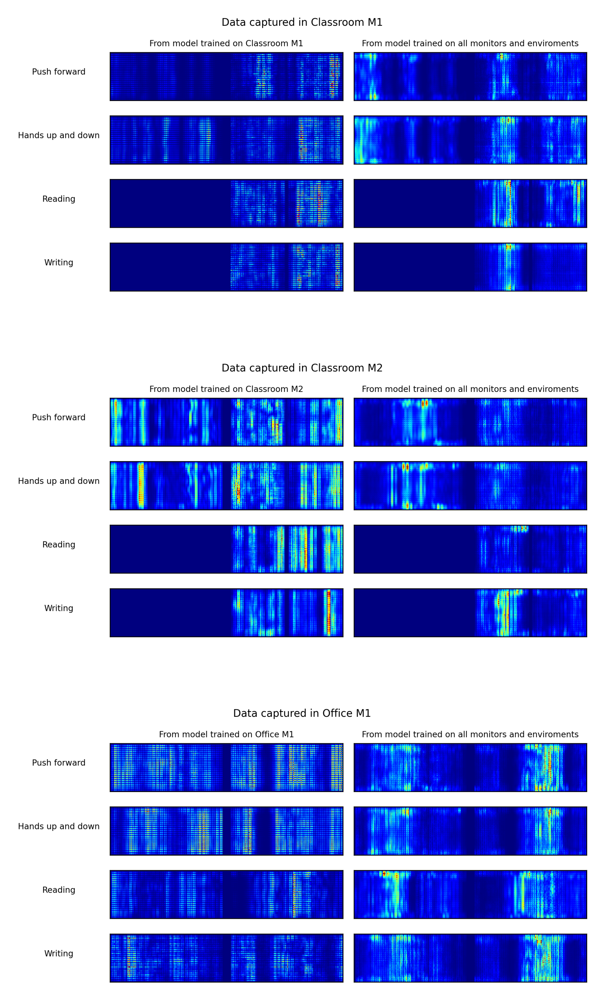

In [15]:
# a subplot with 3 rows, eacho row will imshow a png
fig, axs = plt.subplots(3, 1, figsize=(8, 12), dpi=300)
axs[0].imshow(plt.imread('SAIDAS/19-shap1.png'))
axs[1].imshow(plt.imread('SAIDAS/19-shap2.png'))
axs[2].imshow(plt.imread('SAIDAS/19-shap3.png'))
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')  
plt.savefig(f'SAIDAS/19-shap_all.png', dpi=300, bbox_inches='tight')
plt.show()
